In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings("ignore")

from sklearn.impute import SimpleImputer

# Leyendo datos

In [2]:
data_original =  pd.read_csv("credit_risk_dataset.csv")
data = pd.read_csv("credit_risk_dataset.csv")
print(data.shape)
data.head()

(32581, 12)


,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4


# Descripcion de información

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32581 entries, 0 to 32580
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  32581 non-null  int64  
 1   person_income               32581 non-null  int64  
 2   person_home_ownership       32581 non-null  object 
 3   person_emp_length           31686 non-null  float64
 4   loan_intent                 32581 non-null  object 
 5   loan_grade                  32581 non-null  object 
 6   loan_amnt                   32581 non-null  int64  
 7   loan_int_rate               29465 non-null  float64
 8   loan_status                 32581 non-null  int64  
 9   loan_percent_income         32581 non-null  float64
 10  cb_person_default_on_file   32581 non-null  object 
 11  cb_person_cred_hist_length  32581 non-null  int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 3.0+ MB


In [9]:
data.isnull().sum()/len(data)

person_age                    0.000000
person_income                 0.000000
person_home_ownership         0.000000
person_emp_length             0.027470
loan_intent                   0.000000
loan_grade                    0.000000
loan_amnt                     0.000000
loan_int_rate                 0.095639
loan_status                   0.000000
loan_percent_income           0.000000
cb_person_default_on_file     0.000000
cb_person_cred_hist_length    0.000000
dtype: float64

In [10]:
data = data.fillna(0)

In [5]:
data['loan_status'].value_counts()/len(data)

loan_status
0    0.781836
1    0.218164
Name: count, dtype: float64

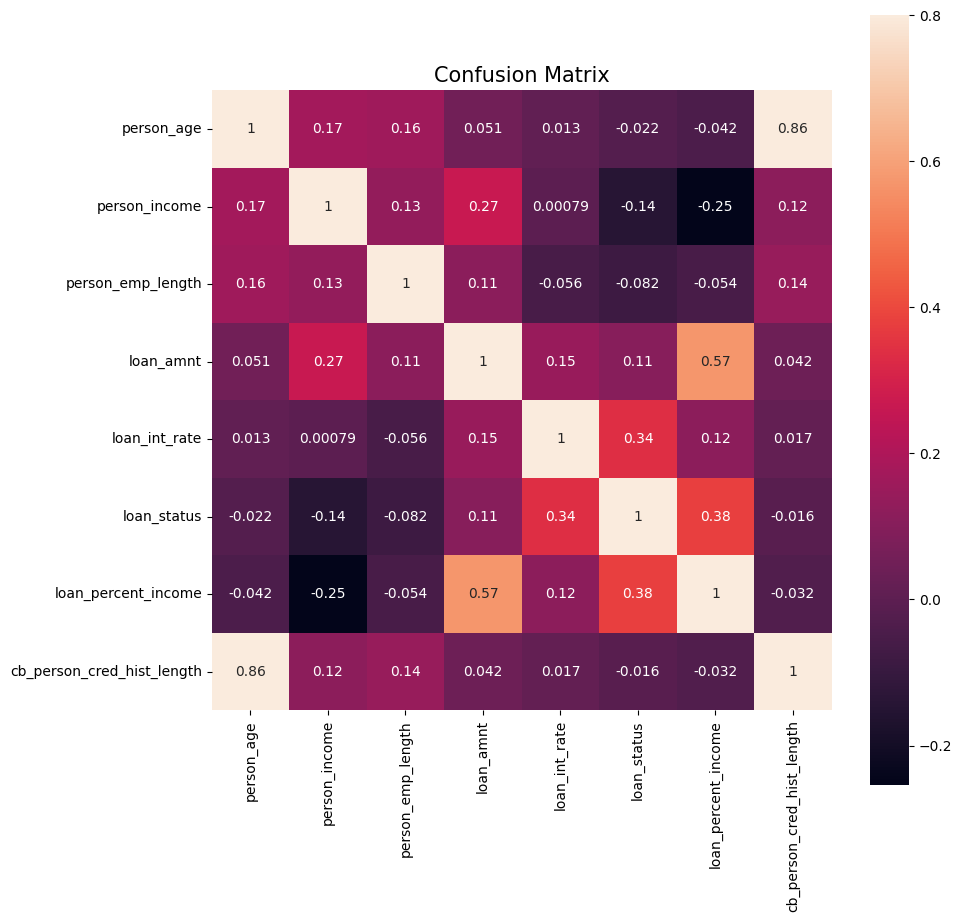

In [6]:
fig, ax = plt.subplots(figsize=(10,10)) 
sns.heatmap(data.corr(numeric_only=True), vmax =.8, square = True, annot = True)
plt.title('Confusion Matrix',fontsize=15);

# Analisis de distribuciones

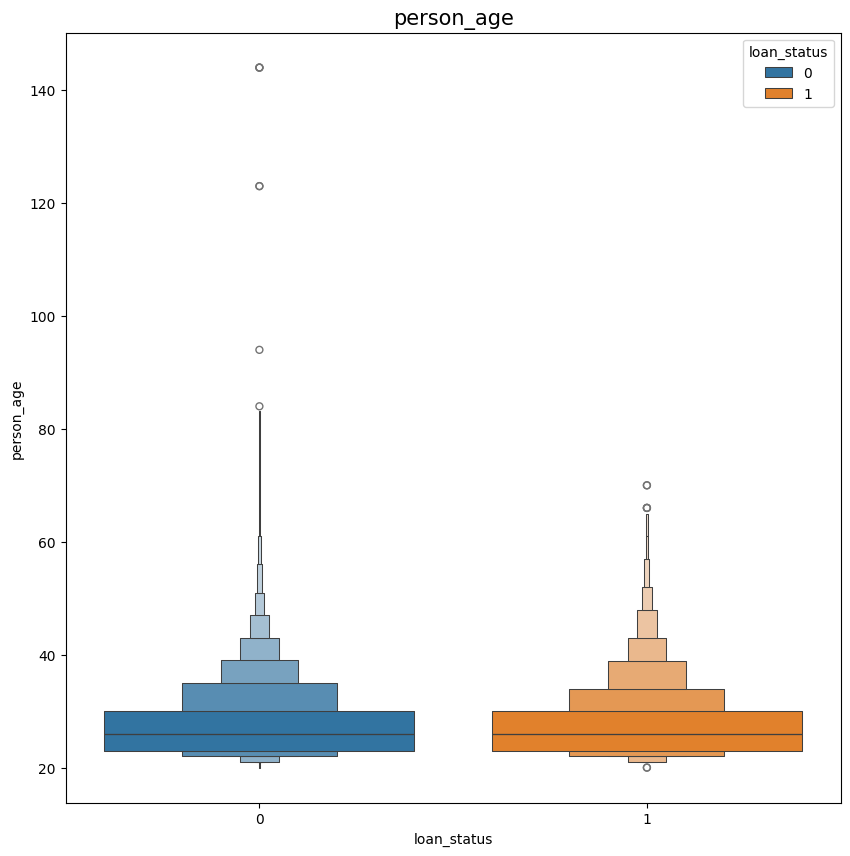

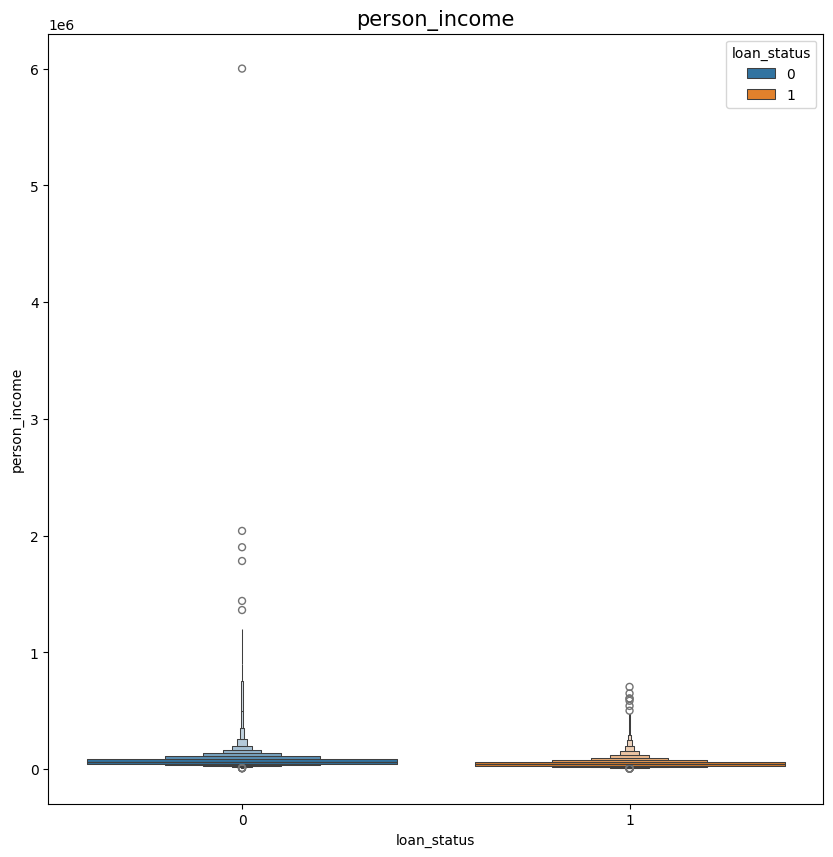

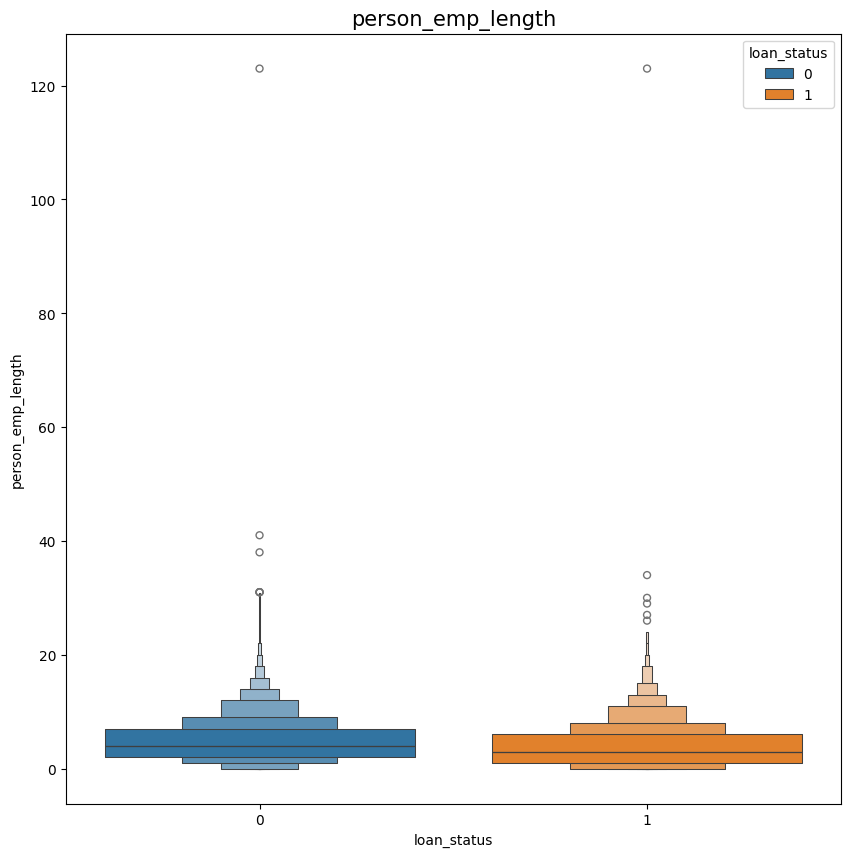

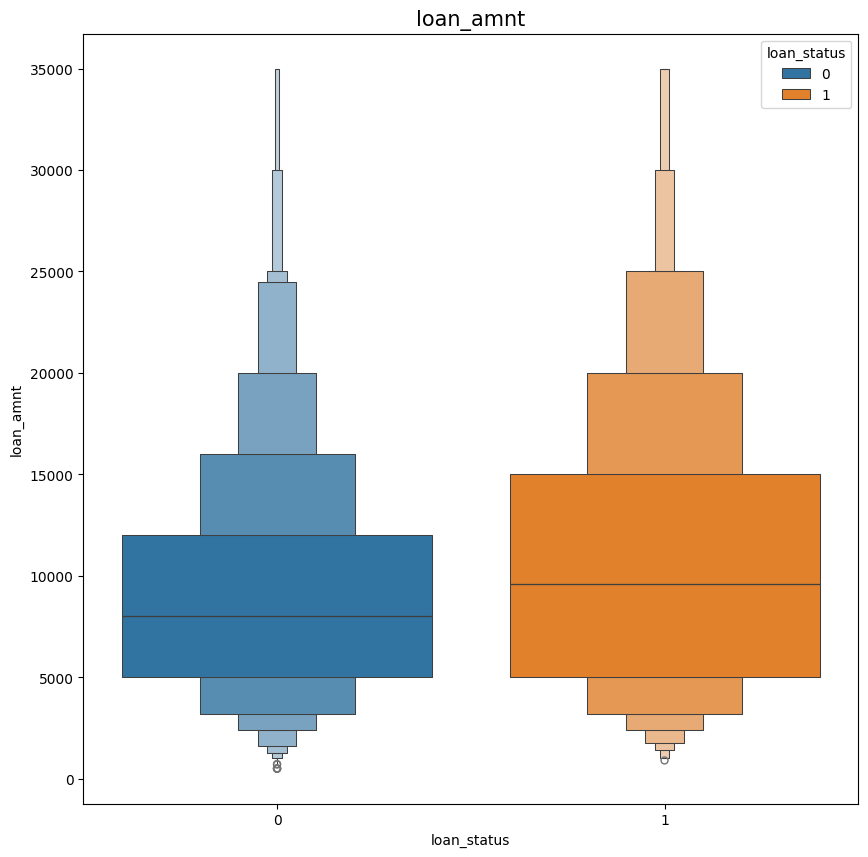

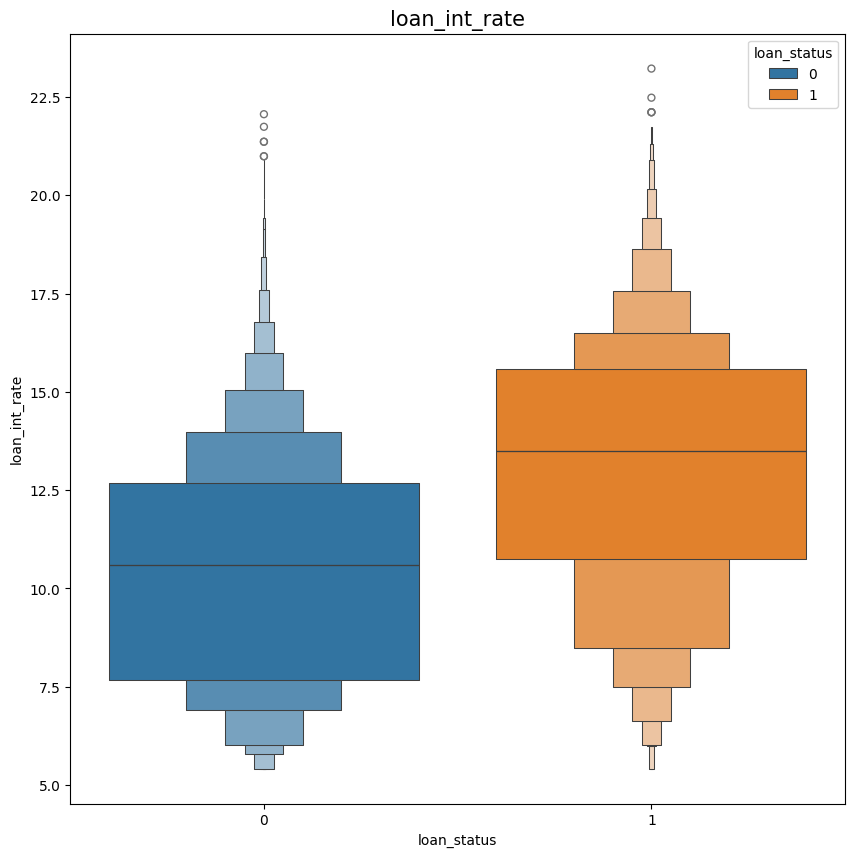

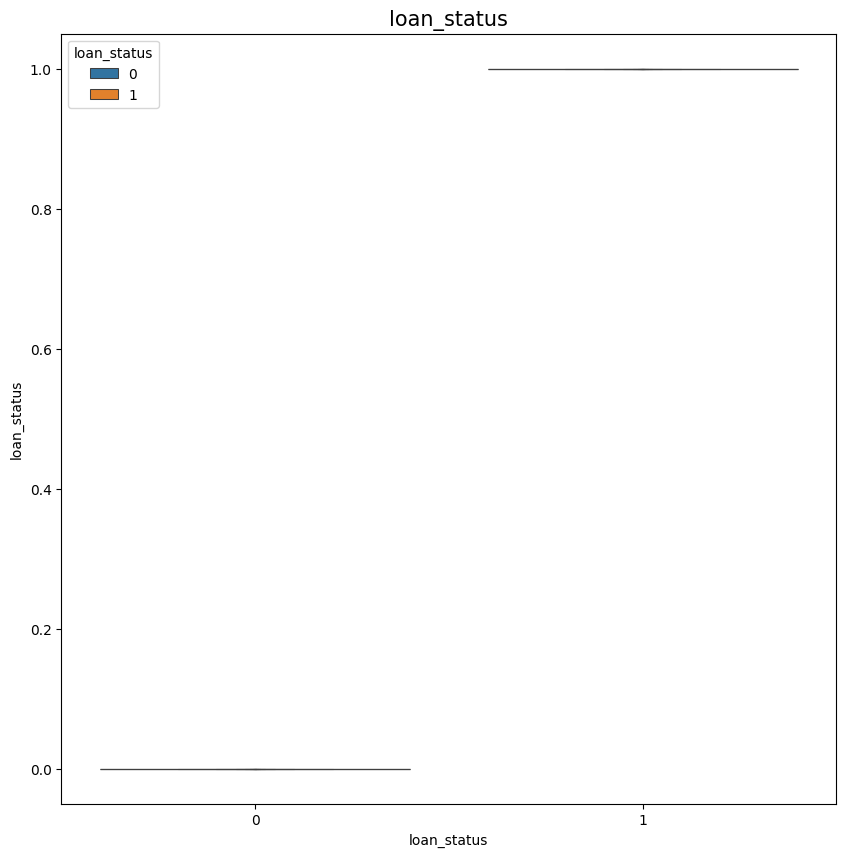

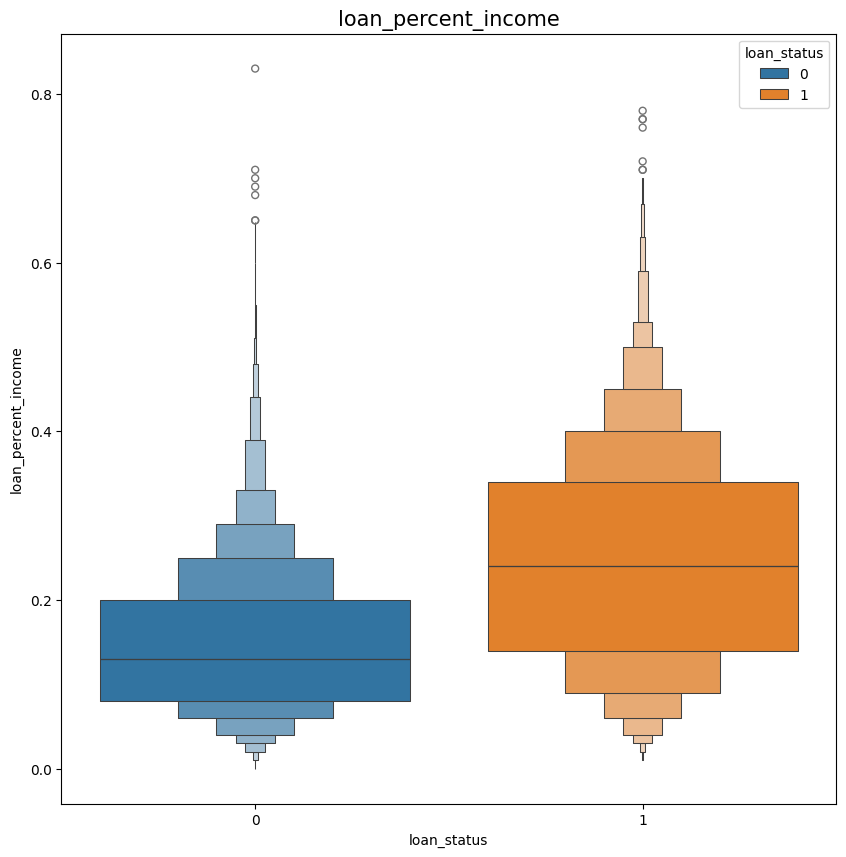

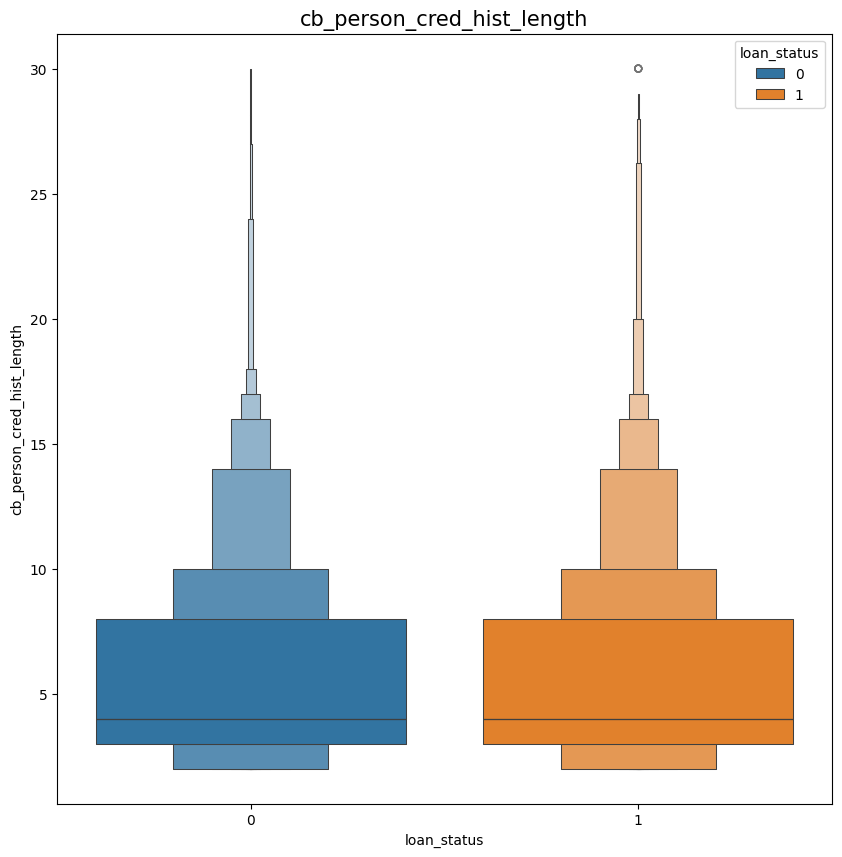

In [7]:
for col in data.columns:
    if data[col].dtypes!='object':
        fig, ax = plt.subplots(figsize=(10,10)) 
        sns.boxenplot(data, x='loan_status', y=col, hue='loan_status')
        plt.title(col,fontsize=15)

# Relación con la variable objetivo

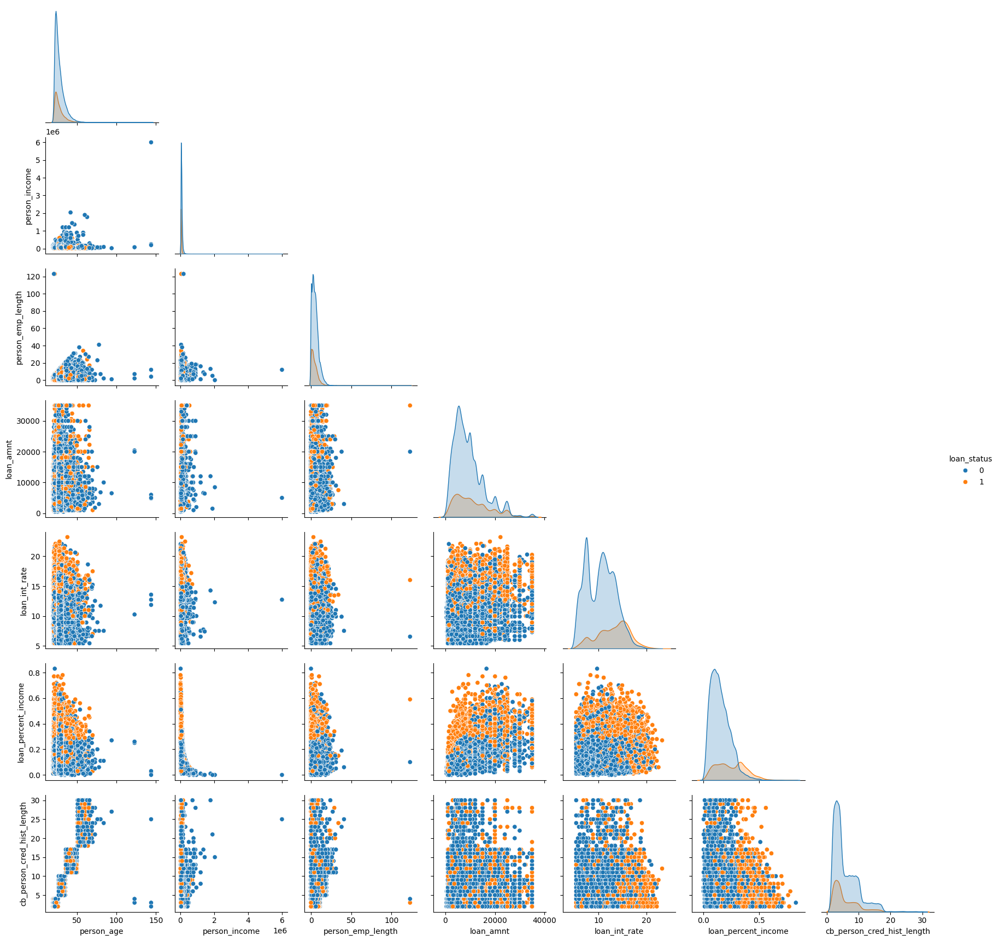

In [8]:
sns.pairplot(data=data, hue='loan_status', corner=True)
plt.show()

# Transformando Variables

In [11]:
variables_pre_transformacion = ['person_income', 'person_emp_length']

for var in variables_pre_transformacion:
    data[f"log_{var}"] = np.log(data[var])
    data = data.drop(var, axis=1)

In [13]:
data

,person_age,person_home_ownership,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,log_person_income,log_person_emp_length
0,22,RENT,PERSONAL,D,35000,16.02,1,0.59,Y,3,10.985293,4.812184
1,21,OWN,EDUCATION,B,1000,11.14,0,0.10,N,2,9.169518,1.609438
2,25,MORTGAGE,MEDICAL,C,5500,12.87,1,0.57,N,3,9.169518,0.000000
3,23,RENT,MEDICAL,C,35000,15.23,1,0.53,N,2,11.089805,1.386294
4,24,RENT,MEDICAL,C,35000,14.27,1,0.55,Y,4,10.904119,2.079442
...,...,...,...,...,...,...,...,...,...,...,...,...
32576,57,MORTGAGE,PERSONAL,C,5800,13.16,0,0.11,N,30,10.878047,0.000000
32577,54,MORTGAGE,PERSONAL,A,17625,7.49,0,0.15,N,19,11.695247,1.386294
32578,65,RENT,HOMEIMPROVEMENT,B,35000,10.99,1,0.46,N,28,11.238489,1.098612
32579,56,MORTGAGE,PERSONAL,B,15000,11.48,0,0.10,N,26,11.918391,1.609438


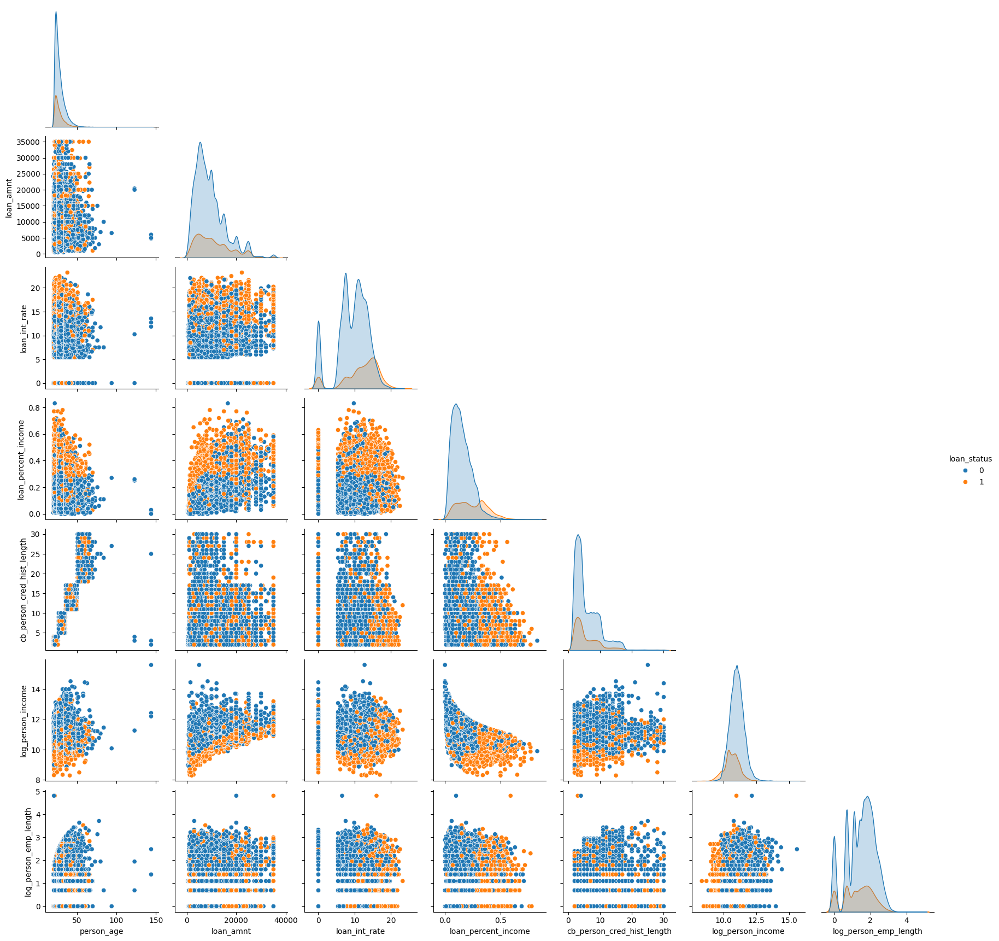

In [12]:
sns.pairplot(data=data, hue='loan_status', corner=True)
plt.show()

# Modelando KMeans

In [44]:
from sklearn.preprocessing import MinMaxScaler, PowerTransformer
from sklearn.cluster import KMeans

## Preparando Datos

In [33]:
X = data_original.drop('loan_status', axis=1)

In [34]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32581 entries, 0 to 32580
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  32581 non-null  int64  
 1   person_income               32581 non-null  int64  
 2   person_home_ownership       32581 non-null  object 
 3   person_emp_length           31686 non-null  float64
 4   loan_intent                 32581 non-null  object 
 5   loan_grade                  32581 non-null  object 
 6   loan_amnt                   32581 non-null  int64  
 7   loan_int_rate               29465 non-null  float64
 8   loan_percent_income         32581 non-null  float64
 9   cb_person_default_on_file   32581 non-null  object 
 10  cb_person_cred_hist_length  32581 non-null  int64  
dtypes: float64(3), int64(4), object(4)
memory usage: 2.7+ MB


In [35]:
X['loan_intent'].value_counts()

loan_intent
EDUCATION            6453
MEDICAL              6071
VENTURE              5719
PERSONAL             5521
DEBTCONSOLIDATION    5212
HOMEIMPROVEMENT      3605
Name: count, dtype: int64

In [36]:
X['loan_grade'].value_counts()

loan_grade
A    10777
B    10451
C     6458
D     3626
E      964
F      241
G       64
Name: count, dtype: int64

In [37]:
X['cb_person_default_on_file'].value_counts()

cb_person_default_on_file
N    26836
Y     5745
Name: count, dtype: int64

In [38]:
X = X.drop(['loan_intent', 'loan_grade'], axis=1)

In [39]:
X['cb_person_default_on_file'] = X['cb_person_default_on_file'].apply(lambda x: 1 if x=='Y' else 0)

In [40]:
X['person_home_ownership'] = X['person_home_ownership'].apply(lambda x: 1 if x=='MORTGAGE' else 0)

In [41]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32581 entries, 0 to 32580
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  32581 non-null  int64  
 1   person_income               32581 non-null  int64  
 2   person_home_ownership       32581 non-null  int64  
 3   person_emp_length           31686 non-null  float64
 4   loan_amnt                   32581 non-null  int64  
 5   loan_int_rate               29465 non-null  float64
 6   loan_percent_income         32581 non-null  float64
 7   cb_person_default_on_file   32581 non-null  int64  
 8   cb_person_cred_hist_length  32581 non-null  int64  
dtypes: float64(3), int64(6)
memory usage: 2.2 MB


## Transformando Datos

In [46]:
transformer = PowerTransformer()
X_transform = pd.DataFrame(data=transformer.fit_transform(X), columns=X.columns, index=X.index)
X_transform

,person_age,person_income,person_home_ownership,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,-1.334245,0.123961,-0.838161,6.811461,2.537303,1.465183,2.369620,2.161294,-0.705839
1,-1.801303,-3.266433,-0.838161,0.310885,-2.395285,0.108930,-0.618946,-0.462686,-1.445588
2,-0.287347,-3.266433,1.193089,-1.030937,-0.537115,0.617067,2.321953,-0.462686,-0.705839
3,-0.933600,0.307514,-0.838161,0.060616,2.537303,1.260587,2.217267,-0.462686,-1.445588
4,-0.587717,-0.019440,-0.838161,0.912275,2.537303,1.004994,2.271248,2.161294,-0.201187
...,...,...,...,...,...,...,...,...,...
32576,2.217797,-0.065656,1.193089,-1.030937,-0.466331,0.699010,-0.483908,-0.462686,2.354109
32577,2.163175,1.347293,1.193089,0.060616,1.238431,-1.102030,0.001363,-0.462686,1.934427
32578,2.323758,0.566560,-0.838161,-0.229843,2.537303,0.063178,1.998580,-0.462686,2.296038
32579,2.200710,1.720588,1.193089,0.310885,0.962466,0.211579,-0.618946,-0.462686,2.231623


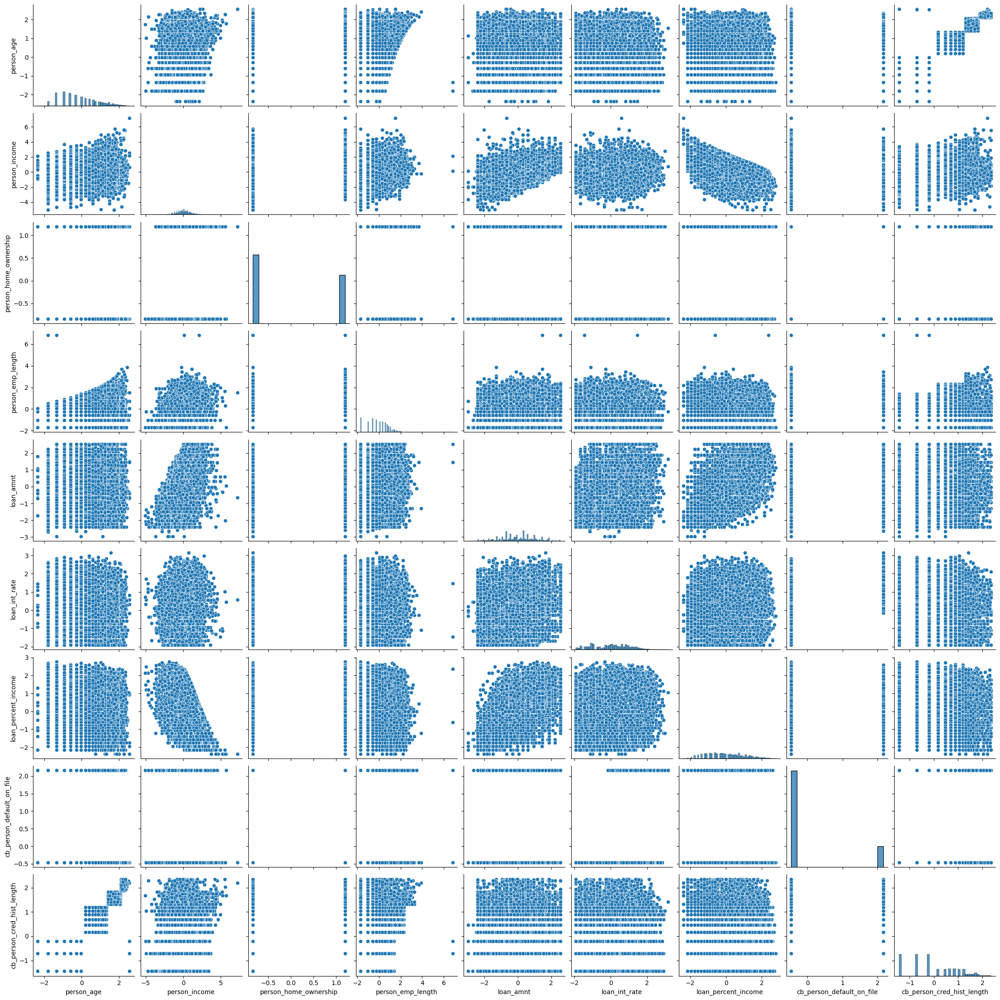

In [47]:
sns.pairplot(X_transform)

In [54]:
sc = MinMaxScaler()
X_final = pd.DataFrame(data=sc.fit_transform(X_transform), columns=X_transform.columns, index= X_transform.index)
X_final

,person_age,person_income,person_home_ownership,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,0.206775,0.422630,0.0,1.000000,1.000000,0.668148,0.922328,1.0,0.194686
1,0.111660,0.145439,0.0,0.236156,0.102863,0.399773,0.340424,0.0,0.000000
2,0.419975,0.145439,1.0,0.078487,0.440827,0.500323,0.913047,0.0,0.194686
3,0.288366,0.437637,0.0,0.206748,1.000000,0.627663,0.892664,0.0,0.000000
4,0.358805,0.410906,0.0,0.306822,1.000000,0.577086,0.903174,1.0,0.327500
...,...,...,...,...,...,...,...,...,...
32576,0.930144,0.407128,1.0,0.078487,0.453701,0.516538,0.366718,0.0,1.000000
32577,0.919021,0.522647,1.0,0.206748,0.763762,0.160148,0.461205,0.0,0.889549
32578,0.951723,0.458816,0.0,0.172618,1.000000,0.390719,0.850083,0.0,0.984717
32579,0.926665,0.553167,1.0,0.236156,0.713570,0.420085,0.340424,0.0,0.967764


In [58]:
imputer = SimpleImputer(missing_values=np.nan, strategy='median')
X_final = pd.DataFrame(data=imputer.fit_transform(X_final), columns=X_final.columns, index=X_final.index)
X_final


,person_age,person_income,person_home_ownership,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,0.206775,0.422630,0.0,1.000000,1.000000,0.668148,0.922328,1.0,0.194686
1,0.111660,0.145439,0.0,0.236156,0.102863,0.399773,0.340424,0.0,0.000000
2,0.419975,0.145439,1.0,0.078487,0.440827,0.500323,0.913047,0.0,0.194686
3,0.288366,0.437637,0.0,0.206748,1.000000,0.627663,0.892664,0.0,0.000000
4,0.358805,0.410906,0.0,0.306822,1.000000,0.577086,0.903174,1.0,0.327500
...,...,...,...,...,...,...,...,...,...
32576,0.930144,0.407128,1.0,0.078487,0.453701,0.516538,0.366718,0.0,1.000000
32577,0.919021,0.522647,1.0,0.206748,0.763762,0.160148,0.461205,0.0,0.889549
32578,0.951723,0.458816,0.0,0.172618,1.000000,0.390719,0.850083,0.0,0.984717
32579,0.926665,0.553167,1.0,0.236156,0.713570,0.420085,0.340424,0.0,0.967764


## Determinando número de clusters por método de codo

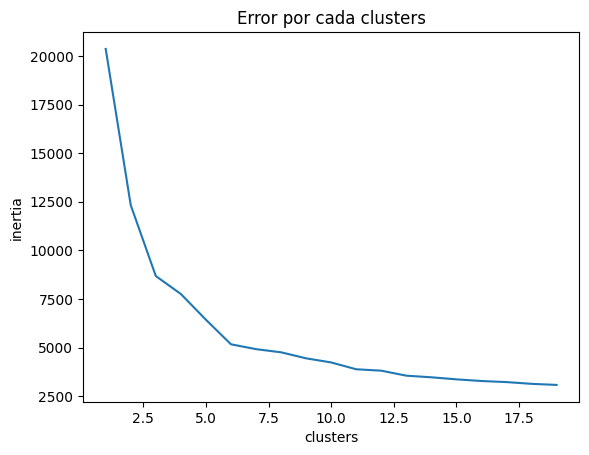

In [61]:
inertia = []
clusters = []

for k in range(1,20):
    kmeans_tmp = KMeans(n_clusters=k, random_state=42)

    kmeans_tmp.fit(X_final)

    inertia.append(kmeans_tmp.inertia_)
    clusters.append(k)


plt.plot(clusters, inertia)
plt.title('Error por cada clusters')
plt.xlabel('clusters')
plt.ylabel('inertia')
plt.show()

## Clusterizacion final

In [65]:
km = KMeans(n_clusters=3, random_state=42)
km.fit(X_final)

KMeans(n_clusters=3, random_state=42)

In [66]:
X_final['cluster'] = km.labels_

## Interpretando Clusters

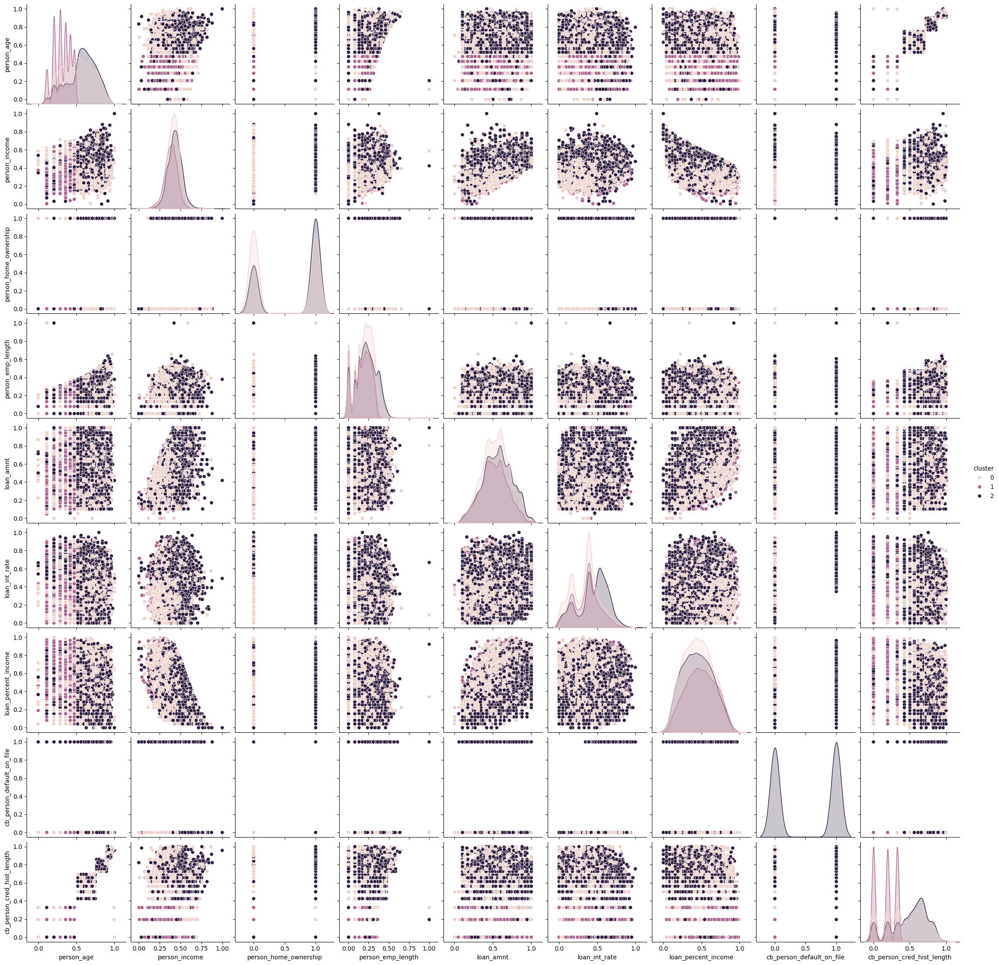

In [67]:
sns.pairplot(X_final, hue='cluster')

## Aplicando PCA

In [68]:
from sklearn.decomposition import PCA

In [71]:
X_final = X_final.drop('cluster', axis=1)

In [87]:
pca_model = PCA(n_components=2)
X_pca = pca_model.fit_transform(X_final)

In [88]:
pca_model.explained_variance_ratio_.sum()

0.7777357281103665

In [89]:
scaler_pca = MinMaxScaler()
X_pca = scaler_pca.fit_transform(X_pca)

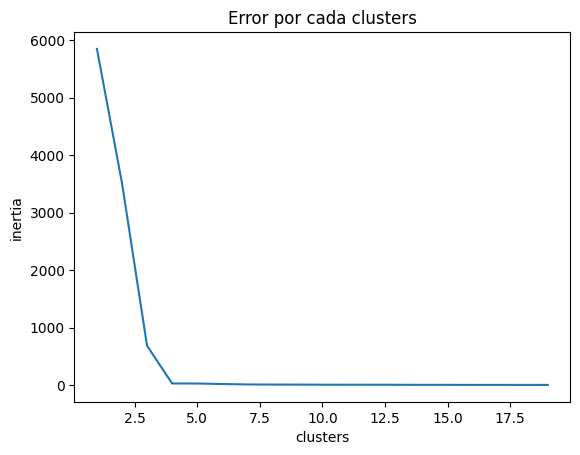

In [90]:
inertia = []
clusters = []

for k in range(1,20):
    kmeans_tmp = KMeans(n_clusters=k, random_state=42)

    kmeans_tmp.fit(X_pca)

    inertia.append(kmeans_tmp.inertia_)
    clusters.append(k)


plt.plot(clusters, inertia)
plt.title('Error por cada clusters')
plt.xlabel('clusters')
plt.ylabel('inertia')
plt.show()

In [95]:
km_pca = KMeans(n_clusters=3, random_state=42)
km_pca.fit(X_pca)

KMeans(n_clusters=3, random_state=42)

In [96]:
X_final['cluster_pca'] = km_pca.labels_

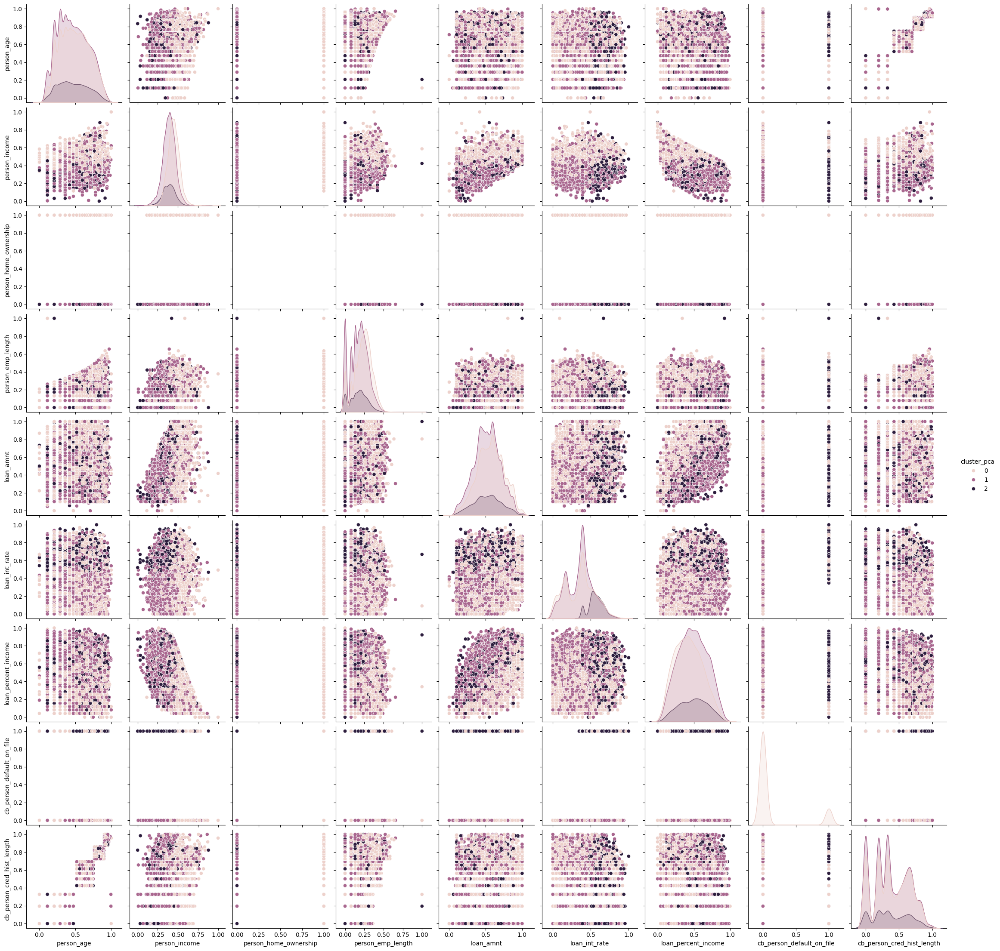

In [97]:
sns.pairplot(X_final, hue='cluster_pca')

In [99]:
data_original['cluster_pca'] =  km_pca.labels_

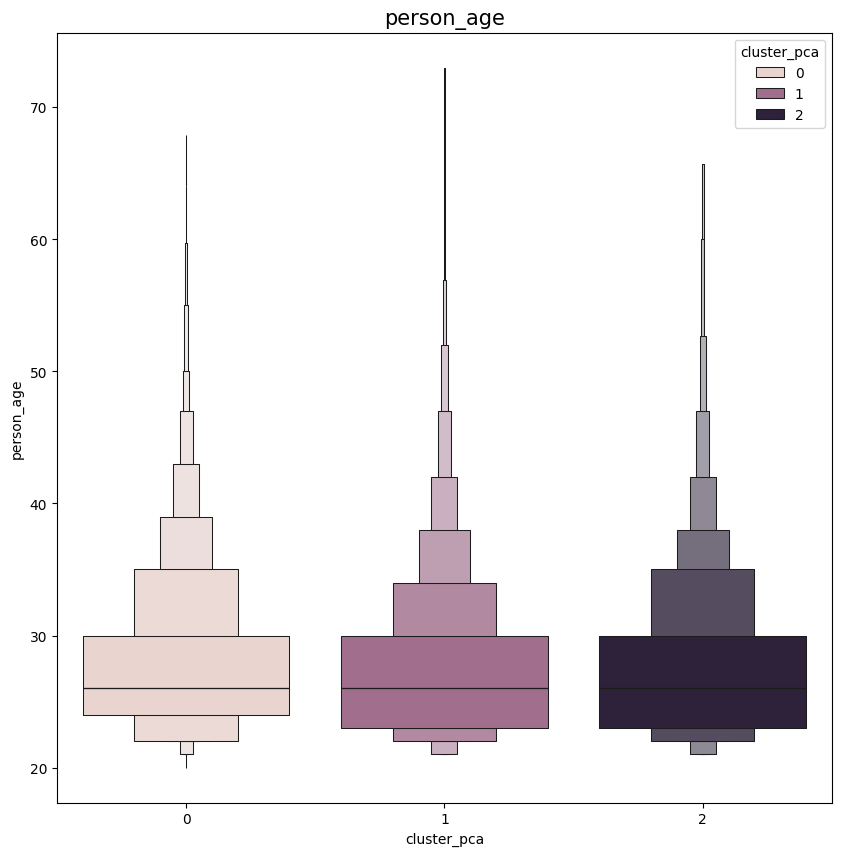

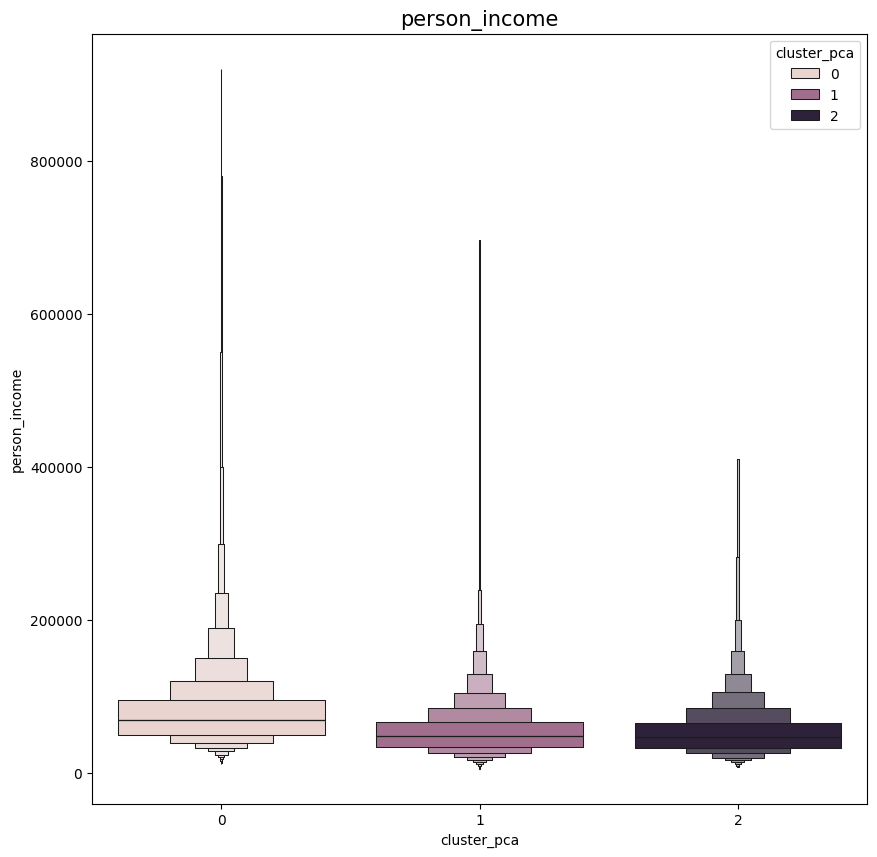

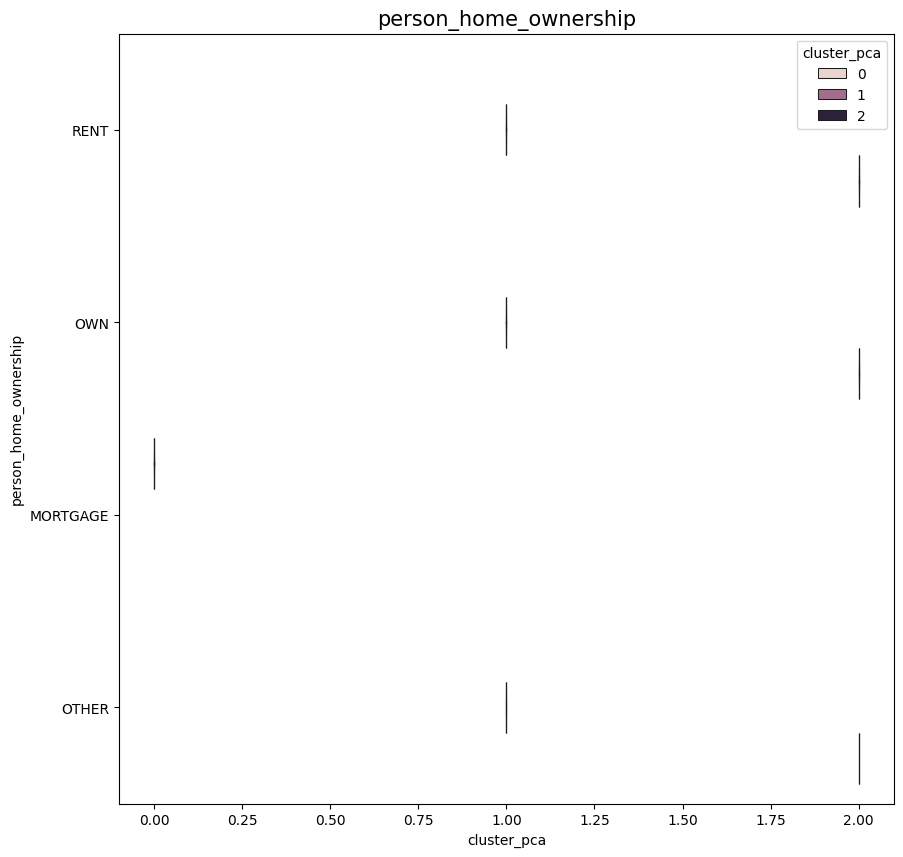

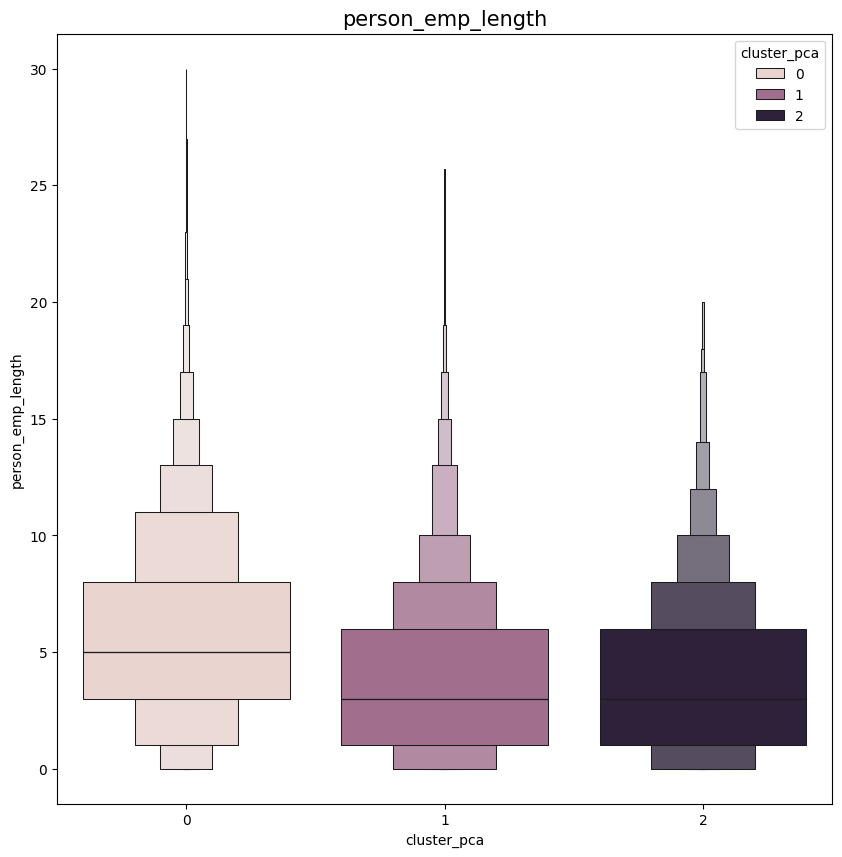

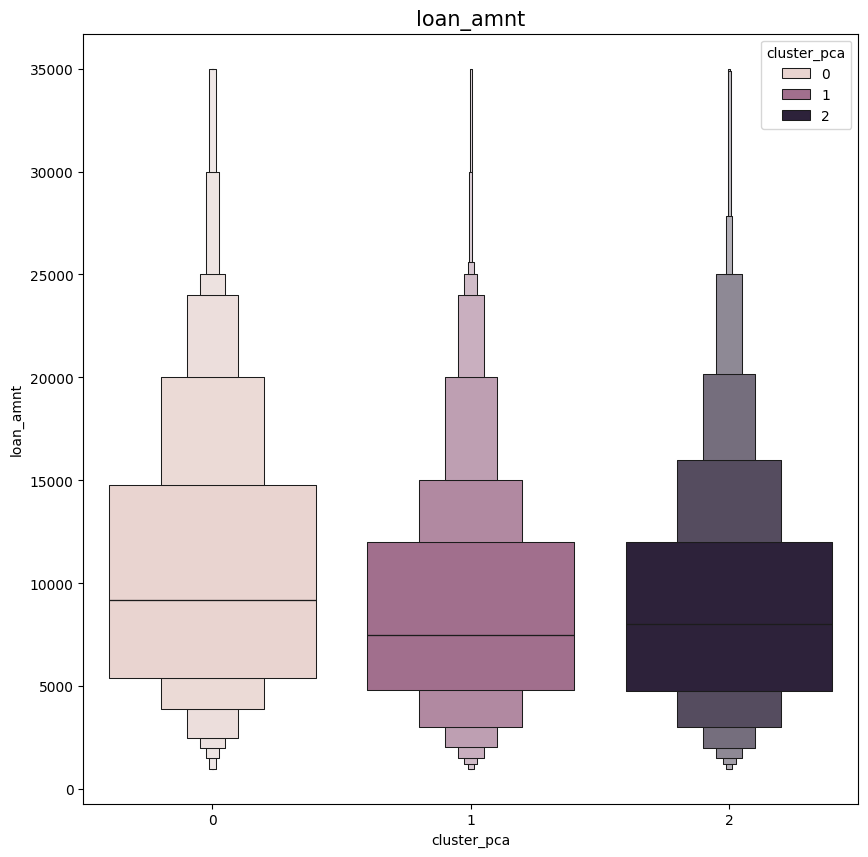

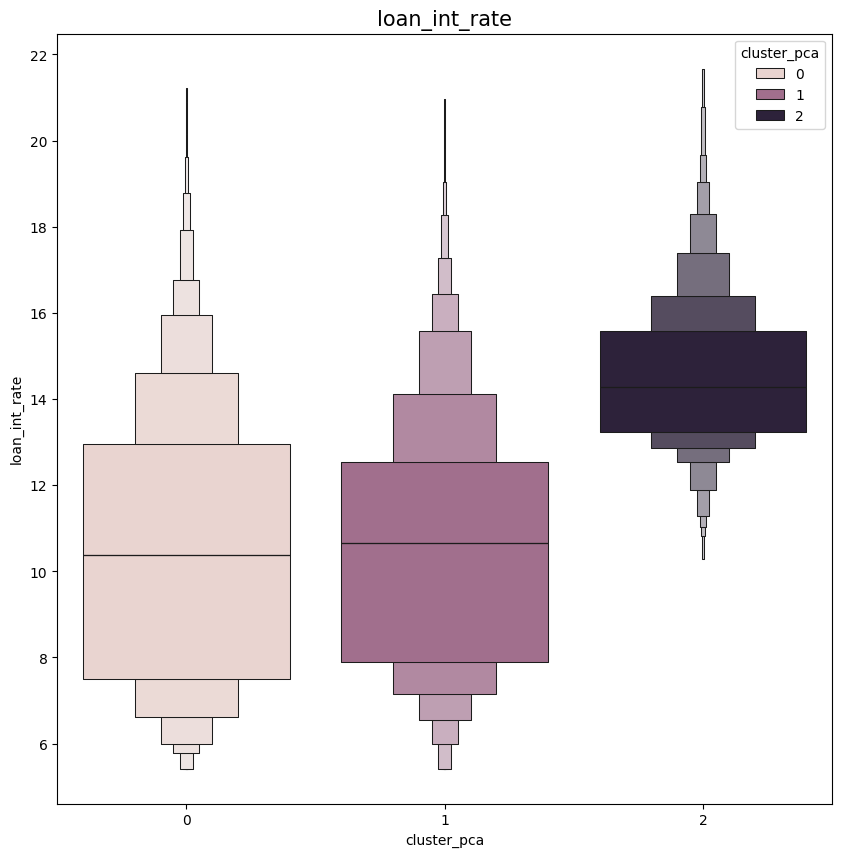

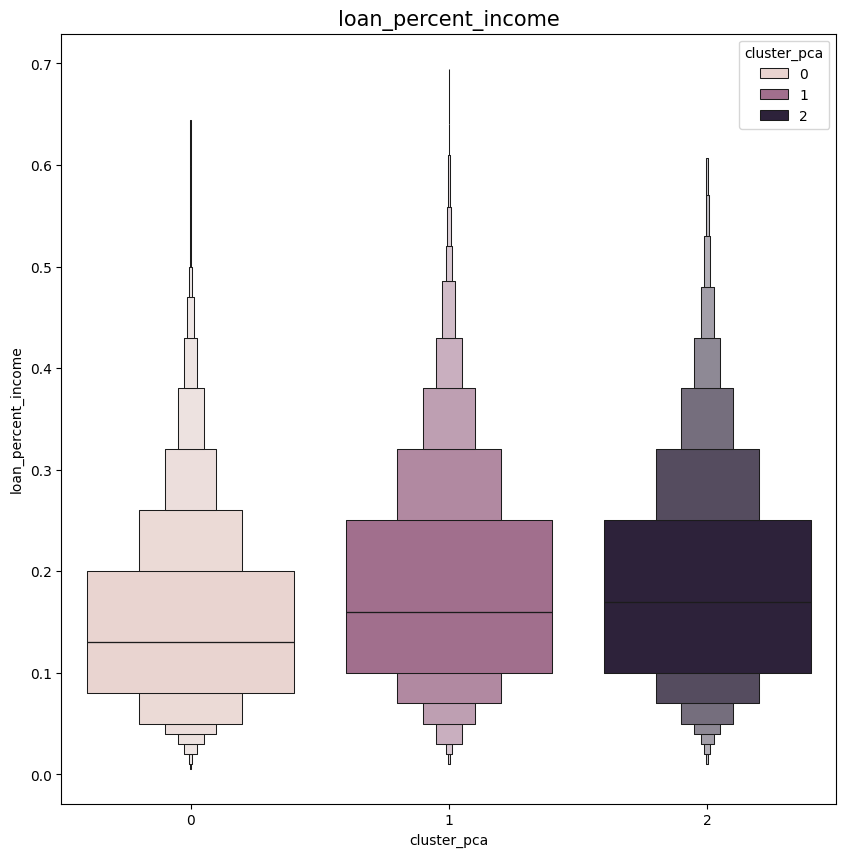

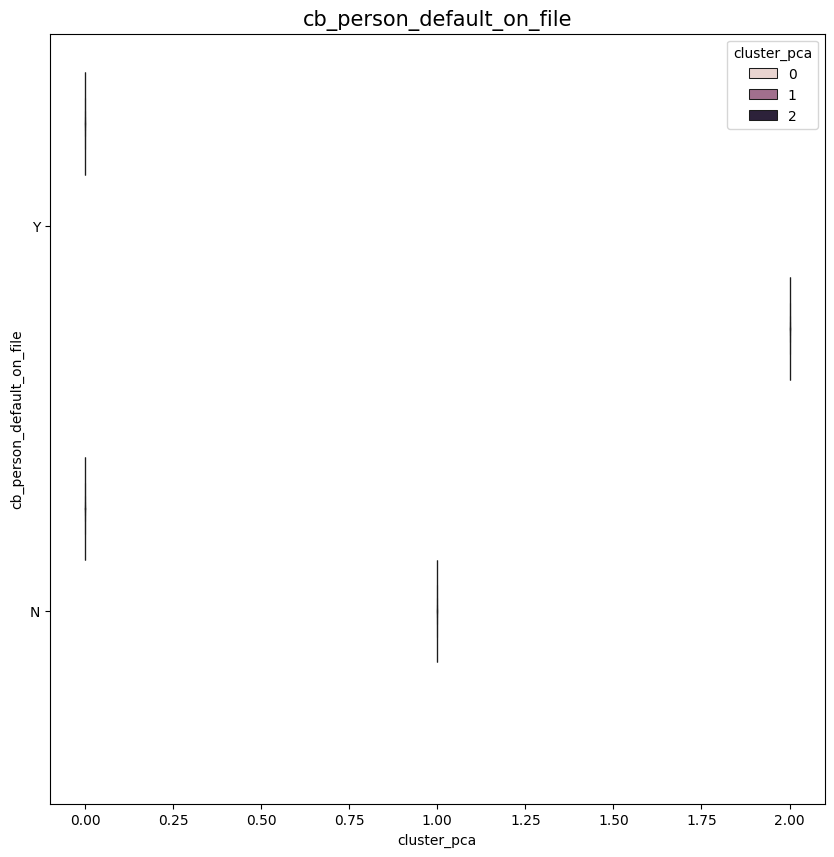

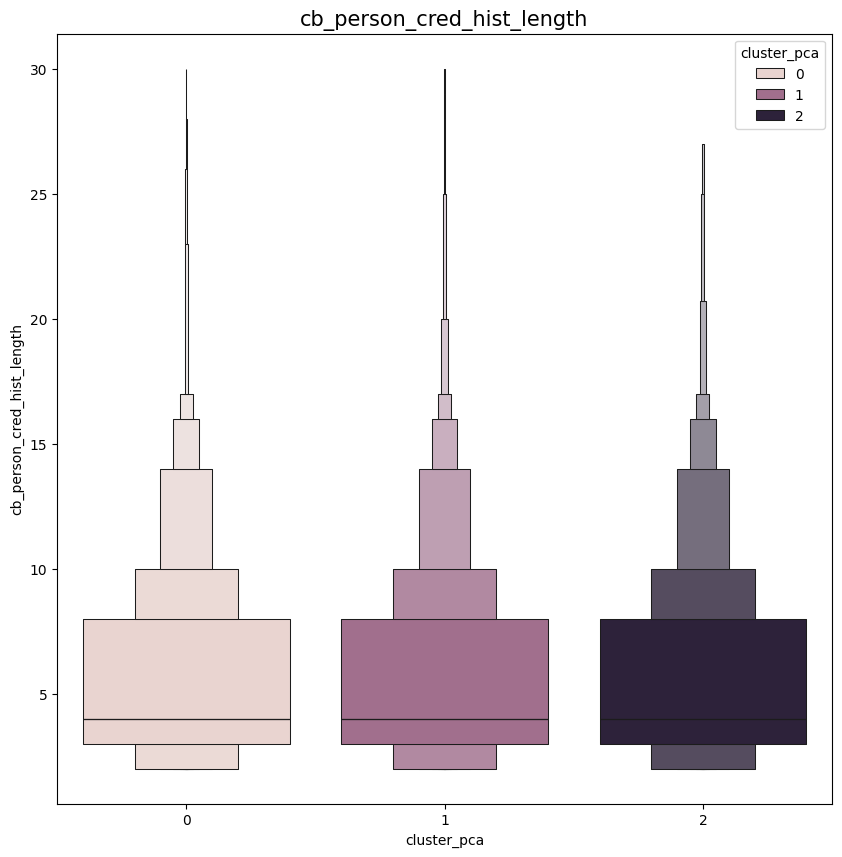

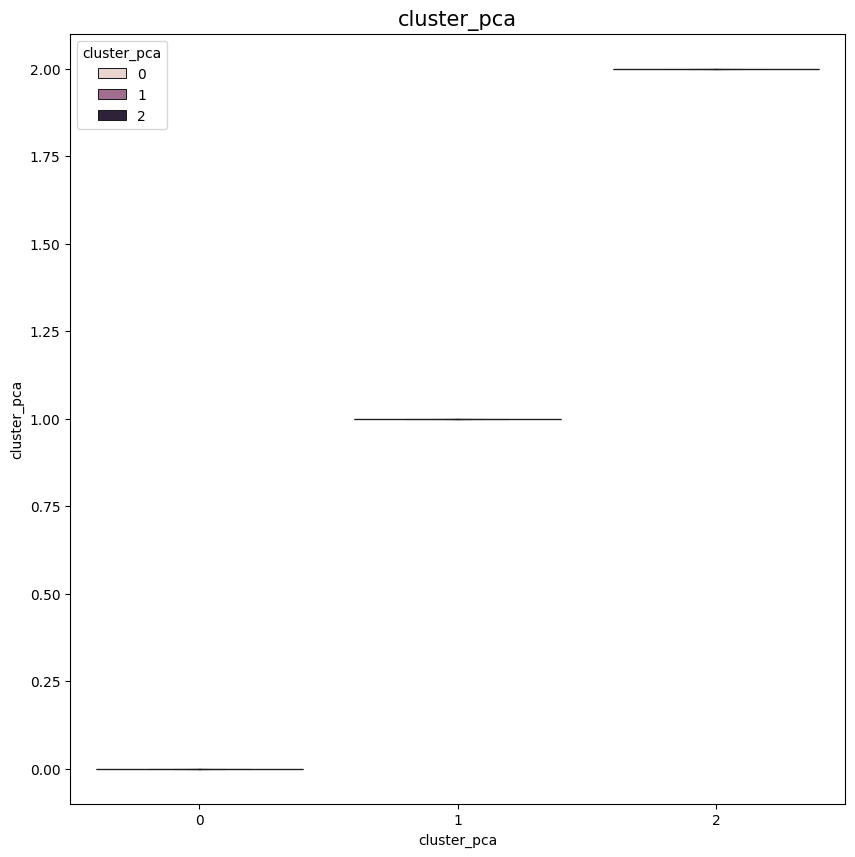

In [102]:
for col in X_final.columns:
    fig, ax = plt.subplots(figsize=(10,10)) 
    sns.boxenplot(data_original, x='cluster_pca', y=col, hue='cluster_pca', showfliers=False)
    plt.title(col,fontsize=15)

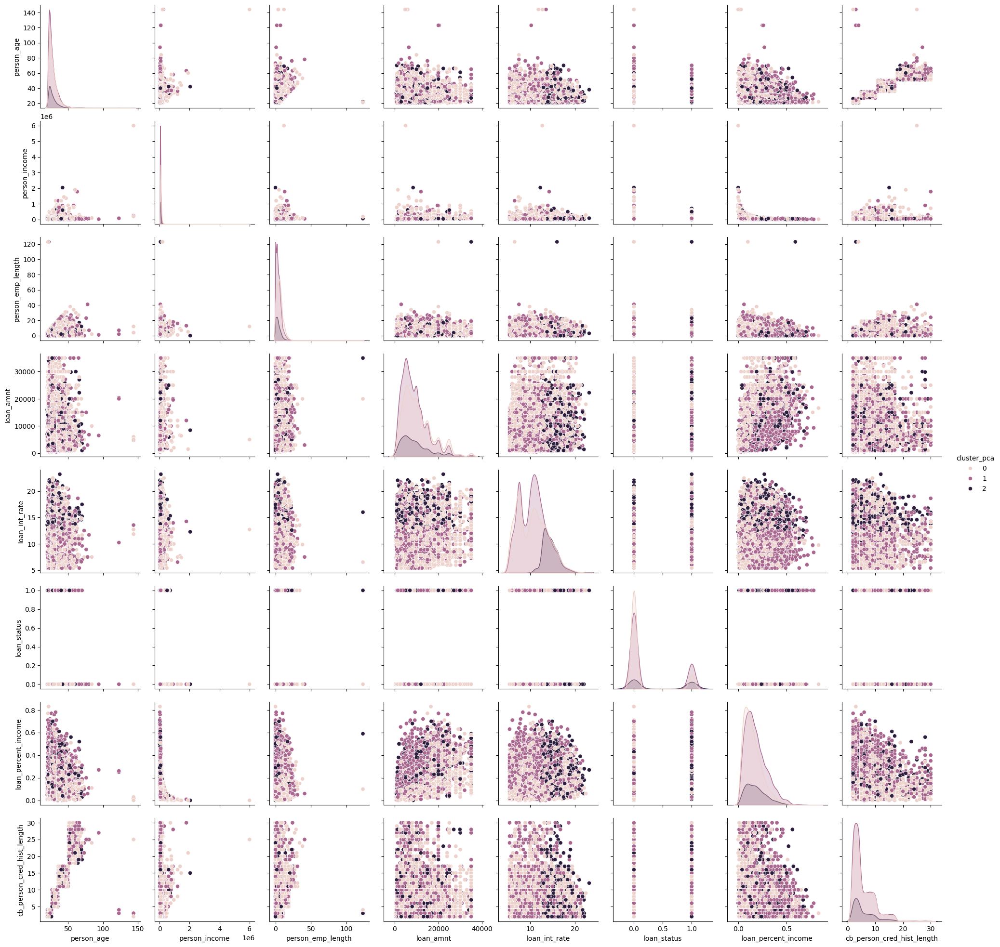

In [103]:
sns.pairplot(data_original, hue='cluster_pca')